# Advanced Lane Lines

### The goals / steps of this project are the following:

- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

- Apply a distortion correction to raw images.

- Use color transforms, gradients, etc., to create a thresholded binary image.

- Apply a perspective transform to rectify binary image ("birds-eye view").

- Detect lane pixels and fit to find the lane boundary.

- Determine the curvature of the lane and vehicle position with respect to center.

- Warp the detected lane boundaries back onto the original image.

- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


### Camera Calibration

The following code calibrates the camera using calibration images provided by Udacity and chessboard corners functions provided by CV2. The `objpoints` array below saves the three-dimensional coordinates of the chessboard corners, and the `imgpoints` array saves the pixel position of the corners. The chessboards were set to have 9x6 internal corners.

Three of the calibration images failed, but we were able to successfully calibrate the camera despite that. The images with the found corners are in the camera_cal/ folder, suffixed with `-corners.jpg`

In [1]:
# Compute the camera calibration matrix and distortion coefficients
# given a set of chessboard images.
# -----------------------------------------------------------------

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt

### Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline
%config InlineBackend.figure_format='retina'

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for index, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = fname+'-corners.jpg'
        cv2.imwrite(write_name, img)
#         cv2.imshow('img', img)
#         cv2.waitKey(0)

cv2.destroyAllWindows()
cv2.waitKey(1) # https://stackoverflow.com/questions/6116564/destroywindow-does-not-close-window-on-mac-using-python-and-opencv


-1

### Application of distortion correction to raw images

Now that we have values for `objpoints` and `imgpoints`, we can calibrate the camera using the cv2 `calibrateCamera` function. We save the resulting calibration parameters to disk in a pickle file. To verify that the camera is correctly calibrated, we test an undistortion on one of the camera calibration images. You can see from the difference between the original image and the undistorted image that the calibration was successful. The undistorted image appears flat and in fact undistorted.

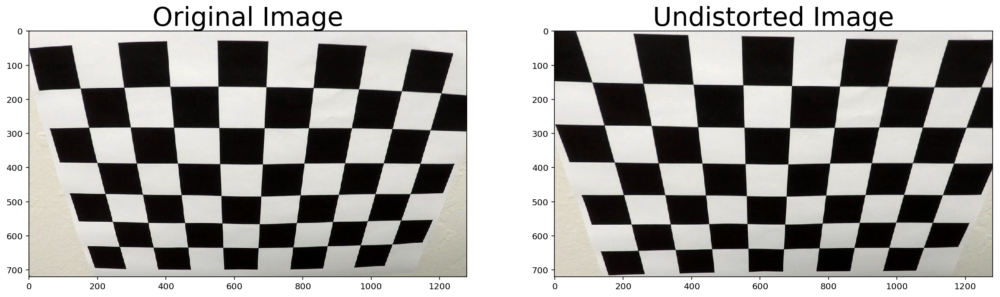

In [85]:
# Apply a distortion correction to raw images.
# --------------------------------------------

import pickle

# Test undistortion on an image
img = cv2.imread('camera_cal/calibration2.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/calibration2_undistorted.jpg', dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)


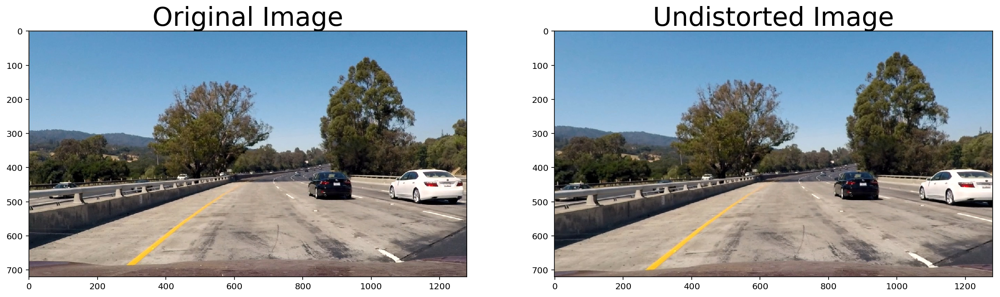

In [78]:
# Test undistortion on an image
img = cv2.imread('test_images/test1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('test_images/test1_undistorted.jpg', dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)


### Thresholding Images

#### Line detection
The next few cells deal with isolating lane lines using image processing techniques. We first create a combined filter that incorporates a sobel filter with magnitude and direction thresholds. The result of this filter is an image that isolates lines from detecting x and y gradients above a certain magnitude and direction.

Testing this filter on images, we can see that while plenty of lines were detected, it has trouble with certain images where the difference in color between the lane line and its surrounding areas were not pronounced, such as yellow lane lines in a bright image.

True

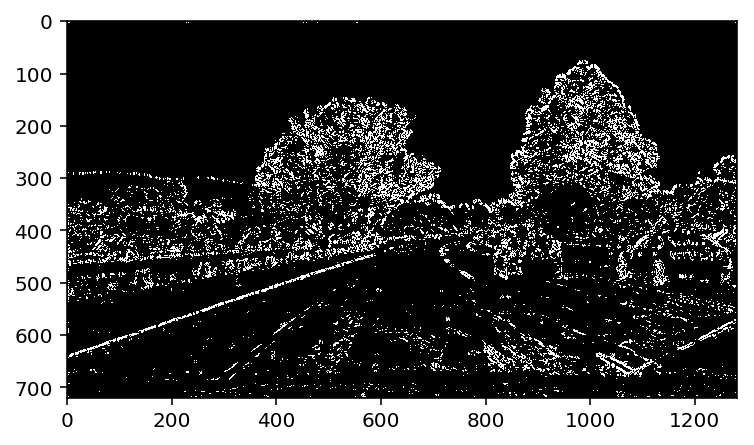

In [87]:
# Use color transforms, gradients, etc., to create a thresholded binary image.

def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobel = None
    if (orient == 'x'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    if (orient == 'y'):
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    return sbinary

# simage = abs_sobel_thresh(test_img, 'x', 3, (20, 150))
# plt.imshow(simage, cmap='gray')

def mag_threshold(image, sobel_kernel=3, mag_thresh=(0, 255)):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    mag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(mag)/255
    
    mag = (mag/scale_factor).astype(np.uint8)
    
    binary_output = np.zeros_like(mag)
    binary_output[(mag >= mag_thresh[0]) & (mag <= mag_thresh[1])] = 1
    
    return binary_output

# binary_image = mag_thresh(test_img, sobel_kernel=9, mag_thresh=(30, 100))
# plt.imshow(binary_image, cmap='gray')

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    absx = np.absolute(sobelx)
    absy = np.absolute(sobely)
    
    grad_dir = np.arctan2(absy, absx)
    
    binary_output = np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1
    
    return binary_output
    
# binary_image = dir_threshold(test_img, sobel_kernel=15, thresh=(0.7, 1.3))

def combined_line_thresholds(image, kernel_size=3):
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=kernel_size, thresh=(20, 100))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=kernel_size, thresh=(10, 100))
    mag_binary = mag_threshold(image, sobel_kernel=kernel_size, mag_thresh=(20, 255))
    dir_binary = dir_threshold(image, sobel_kernel=kernel_size, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    return combined

test_img = cv2.imread('test_images/test1.jpg')
combined_thresholds = combined_line_thresholds(test_img, kernel_size=7)
plt.imshow(combined_thresholds, cmap='gray')
cv2.imwrite('test_images/combined_thresholds.jpg', combined_thresholds)

#### Color Threshold
We add a color threshold to the pipeline to improve the lane detection. We convert the images to two different color definition formats, HLS ans HSV. After some tuning, we were able to find certain thresholds that were successful at isolating lane lines, particularly in situations that were difficult for our line detection algorithm. Running the cell below shows the results of just the color threshold on a test image. You can easily see that the left lane line in this situation is much more pronounced.

True

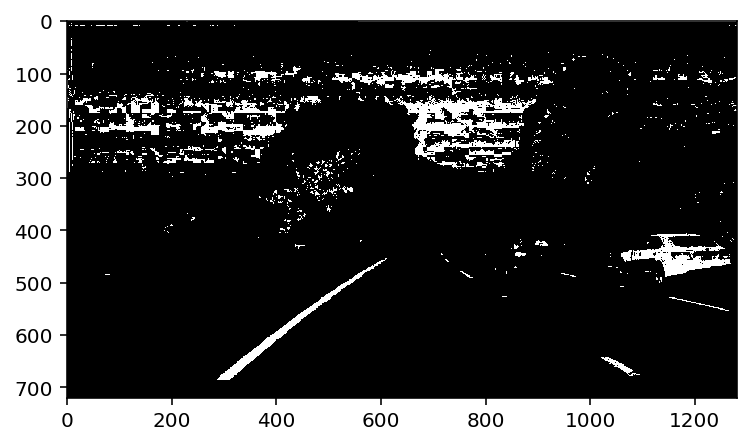

In [88]:

def color_threshold(image, sthresh=(0, 255), vthresh=(0, 255)):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    return output

test_img = cv2.imread('test_images/test1.jpg')
color_thresh_image = color_threshold(test_img, sthresh=(130, 255), vthresh=(50, 255))
plt.imshow(color_thresh_image, cmap='gray')
cv2.imwrite('test_images/color_threshold.jpg', color_thresh_image)

#### Creating a binary image

We combine the line detection and color filters to create a binary image from the original image. The combined image takes the positively detected pixels from the line detection filter and the color filter to create a composite binary image. Below, you can see the stacked image, and the resulting binary image.

True

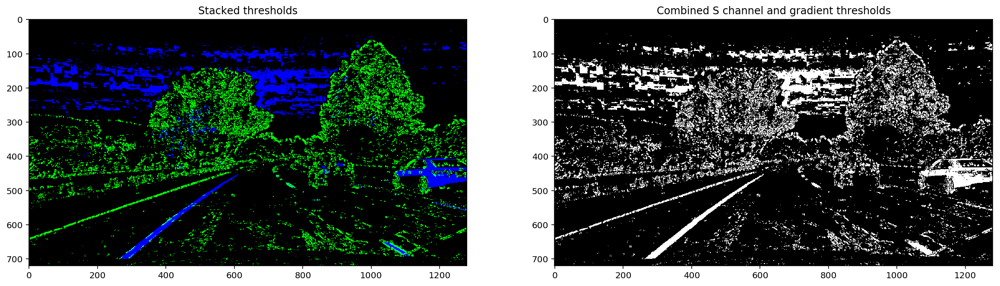

In [89]:
def create_binary_image(img):
    img = cv2.undistort(img, mtx, dist, None, mtx)
    line_thresh_image = combined_line_thresholds(img, kernel_size=7)
    color_thresh_image = color_threshold(img, sthresh=(130, 255), vthresh=(50, 255))
    
    stacked_binary = np.dstack((np.zeros_like(line_thresh_image), line_thresh_image, color_thresh_image))
    
    combined_binary = np.zeros_like(line_thresh_image)
    combined_binary[(line_thresh_image == 1) | (color_thresh_image == 1)] = 1

    return stacked_binary, combined_binary, img

test_img = cv2.imread('test_images/test1.jpg')
stacked_image, output_image, undistorted_img = create_binary_image(test_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(stacked_image)
cv2.imwrite('test_images/stacked_image.jpg', stacked_image)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(output_image, cmap='gray')
cv2.imwrite('test_images/stacked_gray.jpg', output_image)
    

### Pipeline results on test images

The code below shows the tuned pipeline results on the test images provided by Udacity. This combination of techniques does a very good job of highlighting the lane lines in various lighting situations.

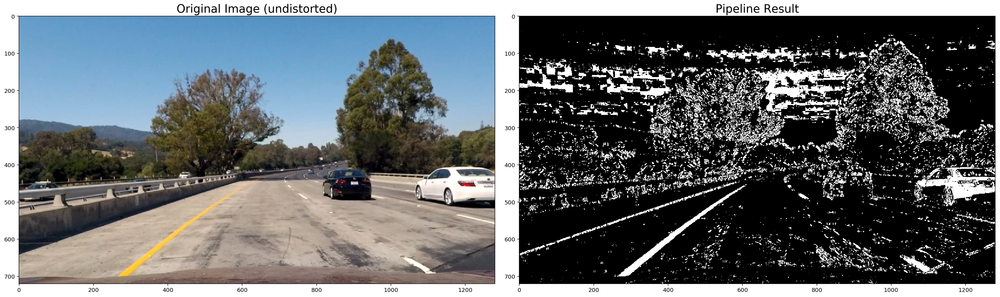

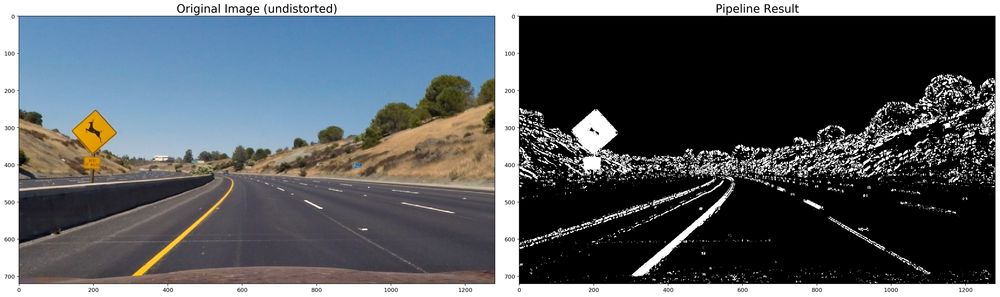

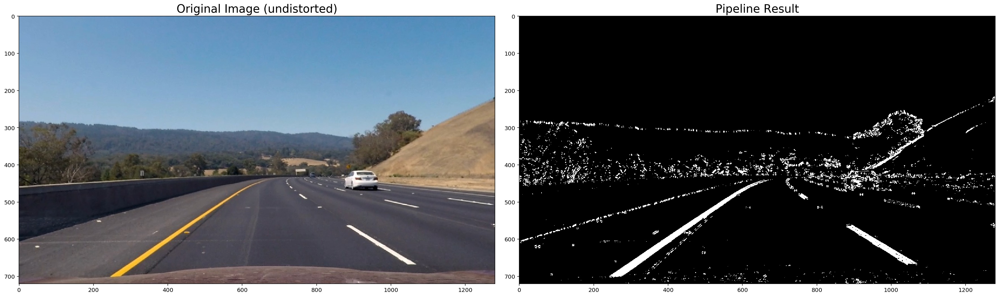

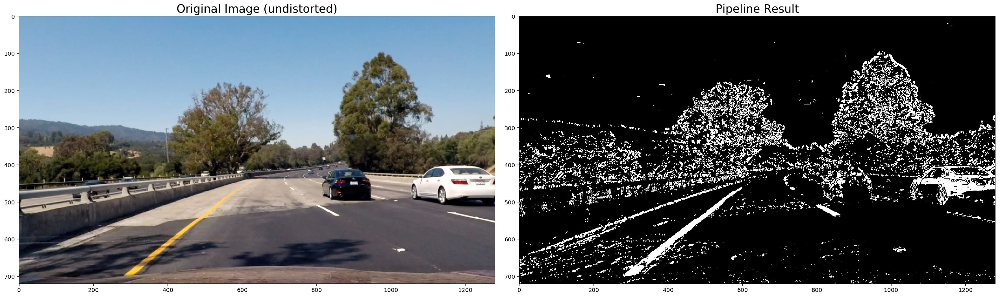

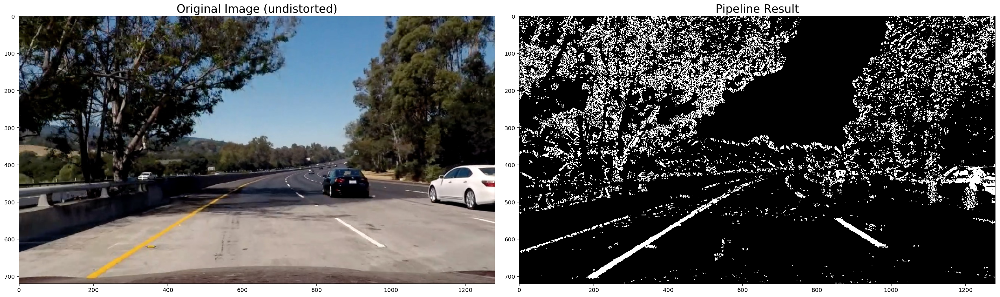

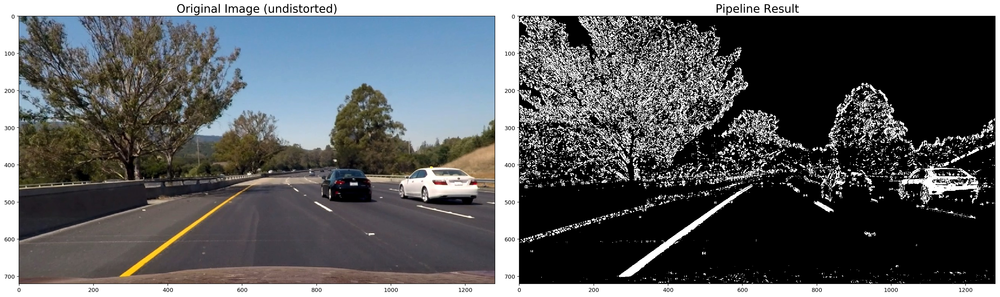

In [26]:
for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = cv2.imread(fname)

    stacked, result, undistorted_img = create_binary_image(image)

    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    undistorted_img = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    ax1.imshow(undistorted_img)
    ax1.set_title('Original Image (undistorted)', fontsize=20)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=20)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Image Transformation

The following functions transform a section of the image that contains lane lines to display the left and right lane lines in roughly parallel form.

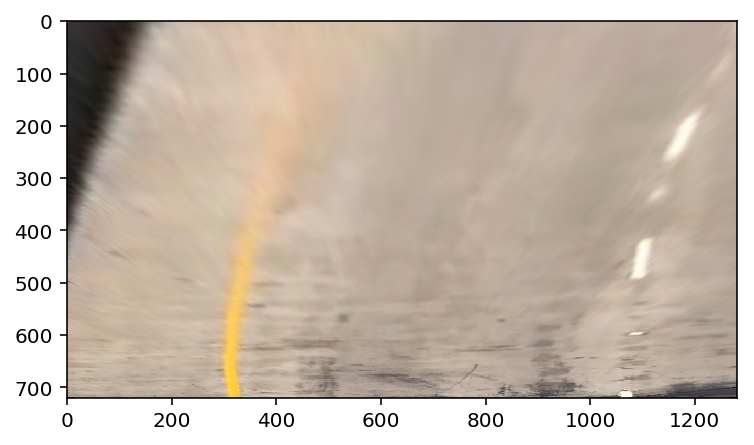

In [69]:
# warp_image

def warp_image(img):
    img_size = (image.shape[1], image.shape[0])
    
    bottom_width = .62
    middle_width = .07
    height_pct = .62
    bottom_trim =  .935

    src = np.float32([[img.shape[1]*(0.5-middle_width/2), img.shape[0]*height_pct],
                      [img.shape[1]*(0.5+middle_width/2), img.shape[0]*height_pct],
                      [img.shape[1]*(0.5-bottom_width/2), img.shape[0]*bottom_trim],
                      [img.shape[1]*(0.5+bottom_width/2), img.shape[0]*bottom_trim]])

    offset = img_size[0]*.2
    
    dst = np.float32([[offset, 0],
                      [img_size[0]-offset, 0],
                      [offset, img_size[1]],
                      [img_size[0]-offset, img_size[1]]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, Minv

test_img = cv2.imread('test_images/test1.jpg')
warped_output_image, M, Minv = warp_image(test_img)
warped_output_image = cv2.cvtColor(warped_output_image, cv2.COLOR_BGR2RGB)
plt.imshow(warped_output_image)

The following loop goes through the test images provided by Udacity, creating a binary image from each, transforming the section of the image corresponding to where we would expect the lane lines to be, and displays the histogram of the binary warped image. The results are shown below, and we can see that the histogram charts do a pretty good job in isolating the lane lines in different situations.

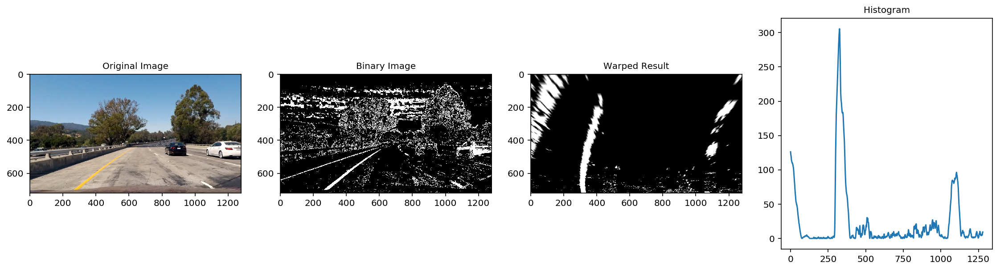

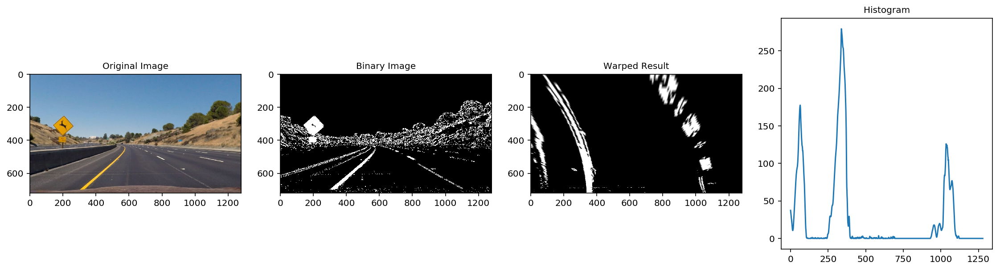

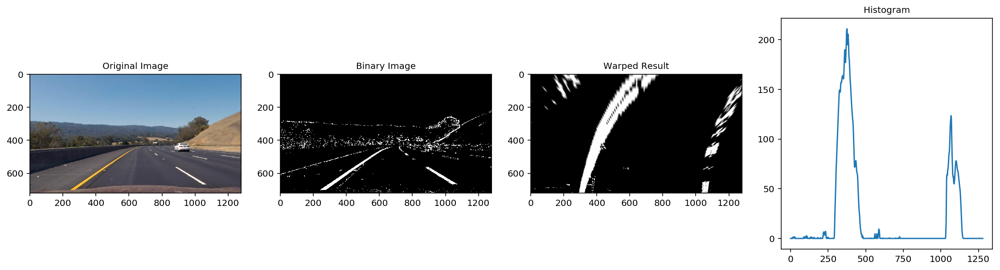

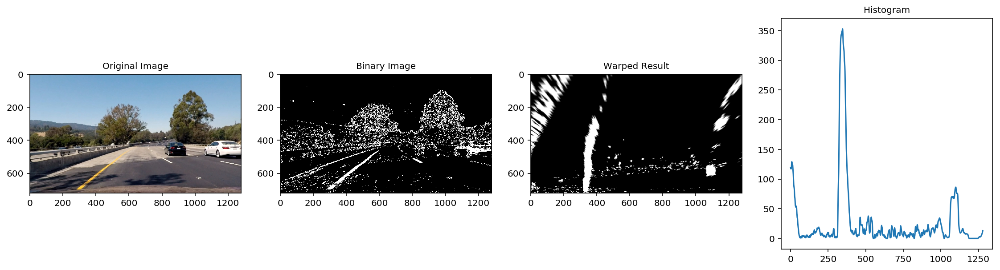

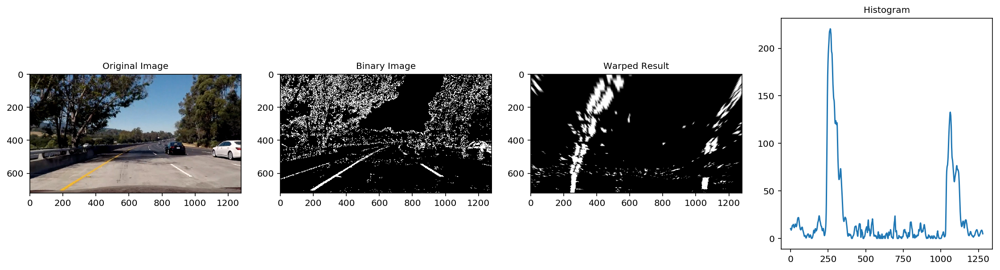

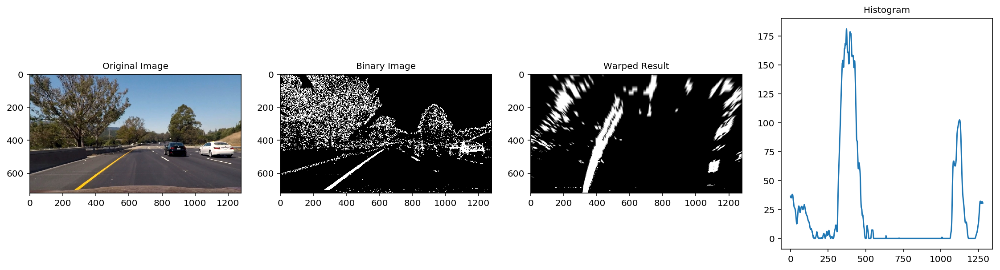

In [70]:
# Display warp results on test images

for i in range(1,7):
    fname = 'test_images/test{}.jpg'.format(i)
    image = cv2.imread(fname)

    stacked, binary, undistorted_img = create_binary_image(image)
    image = cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB)
    warped, M, Minv = warp_image(binary)
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)

    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15, 4))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=10)

    ax2.imshow(binary, cmap='gray')
    ax2.set_title('Binary Image', fontsize=10)
    
    ax3.imshow(warped, cmap='gray')
    ax3.set_title('Warped Result', fontsize=10)

    ax4.plot(histogram)
    ax4.set_title('Histogram', fontsize=10)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Finding lane lines using sliding windows

Using the code base provided by Udacity, we implement a sliding window technique to find lane lines. This algorithm works by taking the maximum values of the histogram from the left and right sides of an image and using that as a starting point, and then searching in rectangles within certain margins through the rest of the image.

To visualize this algorithm, I've outputted an image called `find_window_centroid.jpg` that shows the left lane, right lane, and the searched rectangles.

In [71]:
def find_window_centroids(binary_warped, nwindows=9, margin=100, minpix=50):
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Generate histogram
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin

        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
#     cv2.imwrite("find_window_centroid.jpg", out_img)
#     drawn_img = cv2.imread("find_window_centroid.jpg")

#     drawn_img = cv2.cvtColor(drawn_img, cv2.COLOR_BGR2RGB)
#     plt.imshow(drawn_img)
    
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)

    return left_fit, right_fit, ploty, left_fitx, right_fitx, nonzerox, nonzeroy, left_lane_inds, right_lane_inds

### More efficient searching

To make our search more efficient, if we found a lane in a previous iteration, then we search around that previous iteration. We used the accompanying function `draw_search_area` below to generate an image called `search_area.jpg` that shows the area around which we look for a new lane.

In [72]:
def search_around_previous_fit(binary_warped, left_fit, right_fit):
    # Assume you now have a new warped binary image
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fit, right_fit, ploty, left_fitx, right_fitx, nonzerox, nonzeroy, left_lane_inds, right_lane_inds

In [73]:
def draw_search_area(binary_warped, left_fitx, right_fitx, ploty, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, margin=100):
    print('drawing search area')
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)

    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0, 255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    cv2.imwrite("search_area.jpg", result)
    result = cv2.imread("search_area.jpg")

    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

In [74]:
def draw_lane(image, binary_warped, ploty, left_fitx, right_fitx, Minv, left_curvature, right_curvature):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0]))

    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    
    # we take the average of the left and right curvatures
    curvature = (left_curvature + right_curvature) / 2
    text = "Radius of Curvature: {}m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2)
    
    # Find the position of the car
    xm_per_pix = 3.7/700
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-binary_warped.shape[1]/2)*xm_per_pix
    
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'

    text = "Vehicle is "+str(abs(round(center_diff,3)))+"m "+side_pos+" of center"
    cv2.putText(result,text,(400,150), font, 1,(255,255,255),2)

    return result

### Classes

We create a couple of helper classes to make our pipeline easier to run. We create a `Lane` class, which contains two `Line` instances. The Line class, as suggested by Udacity, holds values for each lane line, including previously found values that assist us in finding subsequent line values. The `Lane` class contains functions to find the left and right lane lines, process images, and perform sanity checks on subsequently found lane line images.

In [82]:
class Lane():
    # Initialize a lane with an input file and an output file
    def __init__(self, input_file, output_file):
        self.input_file = input_file
        self.output_file = output_file
        
        self.left_lane = Line()
        self.right_lane = Line()
    
    # This is the main function to call to find the lines in this lane's video file
    def find_lines(self):
        print(self.output_file)
        clip1 = VideoFileClip(self.input_file)
        white_clip = clip1.fl_image(self.process_image)
        %time white_clip.write_videofile(self.output_file, audio=False)
    
    # This is the main image processing pipeline. It consists of 1) creating a binary image,
    # 2) warping the image, 3) finding the lane, and 4) drawing the lane back onto the original
    # image.
    def process_image(self, image):
        stacked, binary, undistorted_img = create_binary_image(image)
        binary_warped, M, Minv = warp_image(binary)
        left_fit, right_fit, ploty, left_fitx, right_fitx, left_curvature, right_curvature = self.find_lane(binary_warped)
        image = draw_lane(undistorted_img, binary_warped, ploty, left_fitx, right_fitx, Minv, left_curvature, right_curvature)

        return image

    # This function checks to make sure that a newfound lane line make sense given previously
    # found lines.
    def sanity_check(self, lane, curvature, fitx, fit):
        # Check for sanity
        # If sane, then update values and set detected to true
        # If not sane, then use original values and set detected to false
        
        # First time through there will be no radius_of_curvature, so we set the values
        # and set detected = True
        if not lane.radius_of_curvature and not lane.detected:
            lane.detected = True
            lane.recent_xfitted.append(fitx.reshape(1,-1))
            lane.bestx = fitx
            lane.best_fit = fit
            lane.radius_of_curvature = curvature
            lane.current_fit = fit
            lane.line_base_pos = fitx[len(fitx)-1]
            lane.diffs = fit
            
            return lane.bestx

        # The sanity checks are here. A valid new lane line must not differ from a previously
        # found lane line in the following ways:
        # The radius of curvature must be within 70% of the previously found curvature
        # The base position of the lane (the x position of the lane at the highest y value,
        # i.e., the lane position closest to the car), must not differ by 100 pixels or more, and
        # The x position of the lane at the position furthest from the car must also not
        # differ by 100 pixels or more.

        # There is the possibility that we decide a lane line in a new frame is not valid,
        # and subsequent lane lines differ more and more from the previous frame. To ameliorate
        # that potential situation, we introduce a variable consecutive_invalid to keep track
        # of the number of consecutive times we found an invalid line. If we find 10 consecutive
        # invalid lines, we use this newfound lane.
        
        if (abs((lane.radius_of_curvature - curvature)/lane.radius_of_curvature) < 0.7 and
            abs(lane.line_base_pos - fitx[len(fitx)-1]) < 100 and
            abs(lane.bestx[0] - fitx[0]) < 100 or
            lane.consecutive_invalid > 5):
            lane.consecutive_invalid = 0
            lane.radius_of_curvature = curvature
            lane.line_base_pos = fitx[len(fitx)-1]
            lane.detected = True
            lane.best_fit = fit
            lane.recent_xfitted.append(fitx.reshape(1, -1))
            
            # We smooth the lane by taking the average over the last 5 iterations
            if (len(lane.recent_xfitted) > 5):
                lane.recent_xfitted.pop(0)
            
            lane.bestx = np.mean(np.vstack(lane.recent_xfitted), axis=0)
            
            return lane.bestx
        else:
        # If the next lane found is not valid, we set detected = False. 

            lane.detected = False
            lane.consecutive_invalid = lane.consecutive_invalid + 1

            return lane.bestx

    def get_curvature(self, y, fitx):
        # Define y-value where we want radius of curvature
        # I'll choose the maximum y-value, corresponding to the bottom of the image
        y_eval = np.max(y)
        # Define conversions in x and y from pixels space to meters
        # assume the lane is about 30 meters long and 3.7 meters wide
        ym_per_pix = 35/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/800 # meters per pixel in x dimension

        fit_cr = np.polyfit(y * ym_per_pix, fitx * xm_per_pix, 2)
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        return curverad
    
    def find_lane(self, binary_warped):
        left_lane, right_lane = self.left_lane, self.right_lane

        if left_lane.detected and right_lane.detected:
            left_fit, right_fit, ploty, left_fitx, right_fitx, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = \
                search_around_previous_fit(binary_warped, left_lane.best_fit, right_lane.best_fit)
        else:
            left_fit, right_fit, ploty, left_fitx, right_fitx, nonzerox, nonzeroy, left_lane_inds, right_lane_inds = find_window_centroids(binary_warped)

        # Find curvatures
        left_curverad = self.get_curvature(ploty, left_fitx)
        right_curverad = self.get_curvature(ploty, right_fitx)

        # Perform sanity check
        left_fitx = self.sanity_check(left_lane, left_curverad, left_fitx, left_fit)
        right_fitx = self.sanity_check(right_lane, right_curverad, right_fitx, right_fit)

        return left_fit, right_fit, ploty, left_fitx, right_fitx, left_curverad, right_curverad

In [83]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False

        self.consecutive_invalid = 0
        
        # x values of the last n fits of the line
        self.recent_xfitted = [] 

        #average x values of the fitted line over the last n iterations
        self.bestx = None  

        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None

        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]

        #radius of curvature of the line in some units
        self.radius_of_curvature = None

        #distance in meters of vehicle center from the line
        self.line_base_pos = None
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        
        #x values for detected line pixels
        self.allx = None
        
        #y values for detected line pixels
        self.ally = None

In [84]:
lane = Lane("project_video.mp4", "output.mp4")
lane.find_lines()


output.mp4
[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 1260/1261 [06:27<00:00,  3.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 

CPU times: user 6min 46s, sys: 1min 42s, total: 8min 29s
Wall time: 6min 27s


### Results

This pipeline fairly well on the `project_video.mp4` file. There are some instances in the video where the lane lines jump a little bit, and this appears to be caused by the presence of shadows where the lane color becomes brighter than the typically black. The video `output.mp4` contains the results.

Using this pipeline on the challenge video yielded poor results, as can be seen on the `challenge_output.mp4` video. To obtain better results on that set of images, we would like to tweak the parameters and use test images that are more similar to that video to achieve better results.